In [1]:
import pandas as pd
#pd.set_option('display.max_rows', None)
import geopandas as gpd
import matplotlib.pyplot as plt
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import numpy as np
import netCDF4 as nc
np.set_printoptions(threshold=100000)
from shapely.geometry import Polygon, Point, MultiPoint
from shapely.ops import cascaded_union
from datetime import datetime, timedelta
import time
import warnings
import statsmodels.api as sm
import datetime


In [2]:
load = pd.read_csv('../LF_ConsumeLoadings.csv', skiprows=1)
load

,fuelbed_number,filename,cover_type,ecoregion,overstory_loading,midstory_loading,understory_loading,snags_c1_foliage_loading,snags_c1wo_foliage_loading,snags_c1_wood_loading,...,duff_lower_depth,duff_lower_loading,duff_upper_depth,duff_upper_loading,pile_clean_loading,pile_dirty_loading,pile_vdirty_loading,Total_available_fuel_loading,efg_natural,efg_activity
0,0_111,FB_0000_FCCS_111.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9
1,0_112,FB_0000_FCCS_112.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9
2,0_113,FB_0000_FCCS_113.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9
3,0_121,FB_0000_FCCS_121.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9
4,0_122,FB_0000_FCCS_122.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12217,1299_122,FB_1299_AG_122.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.756875,9,9
12218,1299_123,FB_1299_AG_123.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.317500,9,9
12219,1299_131,FB_1299_AG_131.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.020869,9,9
12220,1299_132,FB_1299_AG_132.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.946875,9,9


In [3]:
fuelbeds = np.zeros((len(load)))
for ii in range(len(load)):
    fuelbeds[ii]=int(load['filename'].iloc[ii][3:7])

In [4]:
load = pd.concat([load, pd.DataFrame({'fuelbeds':fuelbeds})], axis=1)
load

,fuelbed_number,filename,cover_type,ecoregion,overstory_loading,midstory_loading,understory_loading,snags_c1_foliage_loading,snags_c1wo_foliage_loading,snags_c1_wood_loading,...,duff_lower_loading,duff_upper_depth,duff_upper_loading,pile_clean_loading,pile_dirty_loading,pile_vdirty_loading,Total_available_fuel_loading,efg_natural,efg_activity,fuelbeds
0,0_111,FB_0000_FCCS_111.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9,0.0
1,0_112,FB_0000_FCCS_112.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9,0.0
2,0_113,FB_0000_FCCS_113.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9,0.0
3,0_121,FB_0000_FCCS_121.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9,0.0
4,0_122,FB_0000_FCCS_122.xml,404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,9,9,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12217,1299_122,FB_1299_AG_122.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.756875,9,9,1299.0
12218,1299_123,FB_1299_AG_123.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.317500,9,9,1299.0
12219,1299_131,FB_1299_AG_131.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.020869,9,9,1299.0
12220,1299_132,FB_1299_AG_132.xml,404,220.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.946875,9,9,1299.0


In [5]:
load_grouped = load.groupby(by='fuelbeds').sum()
load_grouped

,cover_type,ecoregion,overstory_loading,midstory_loading,understory_loading,snags_c1_foliage_loading,snags_c1wo_foliage_loading,snags_c1_wood_loading,snags_c2_loading,snags_c3_loading,...,duff_lower_depth,duff_lower_loading,duff_upper_depth,duff_upper_loading,pile_clean_loading,pile_dirty_loading,pile_vdirty_loading,Total_available_fuel_loading,efg_natural,efg_activity
fuelbeds,,,,,,,,,,,,,,,,,,,,,
0.0,3636,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.000,0.000000,0.000000,0.000000,0.0,0.000000,81,81
1.0,585,10800.0,433.073230,189.999990,11.862979,198.884116,1536.839359,1723.265488,632.843130,26.160012,...,0.0,0.0,78.300,576.120008,0.000000,0.000000,0.0,3293.340237,405,405
2.0,5895,10800.0,271.510440,153.394476,8.160080,33.703038,0.000000,2540.381344,1067.051675,270.541518,...,0.0,0.0,117.450,723.105021,0.000000,0.000000,0.0,7582.973213,360,45
3.0,1224,2160.0,41.283347,0.000000,2.114534,23.222470,0.000000,70.024123,33.951332,19.904952,...,0.0,0.0,7.875,37.273503,0.000000,7.991922,0.0,334.996782,72,9
4.0,5310,10800.0,80.496192,0.000000,5.730649,8.956823,0.000000,27.078276,0.000000,0.000000,...,0.0,0.0,58.725,260.595004,5.869008,0.000000,0.0,2426.441623,360,45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1295.0,3636,1980.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.000,0.000000,0.000000,0.000000,0.0,5.694059,81,81
1296.0,3636,1980.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.000,0.000000,0.000000,0.000000,0.0,7.850059,81,81
1297.0,3636,1980.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.000,0.000000,0.000000,0.000000,0.0,7.948059,81,81


In [6]:
load_grouped_final = load_grouped['Total_available_fuel_loading']
load_grouped_final

fuelbeds
0.0          0.000000
1.0       3293.340237
2.0       7582.973213
3.0        334.996782
4.0       2426.441623
             ...     
1295.0       5.694059
1296.0       7.850059
1297.0       7.948059
1298.0       5.106059
1299.0       7.556059
Name: Total_available_fuel_loading, Length: 389, dtype: float64

In [7]:
# load in the FCCS Data
path = '../static_maps/static_map_1km.nc4'
dat = nc.Dataset(path)  

lat = dat['lat'][:]
lon = dat['lon'][:]
fccs = dat['fccs'][:]
fccs[np.where(fccs<0)] = np.nan
print(fccs)
LON, LAT = np.meshgrid(lon,lat)
print(fccs.shape)
print(LAT)
print(LON)

[[ nan  nan  nan ... 411. 411. 411.]
 [ nan  nan  nan ... 232. 232. 411.]
 [ nan  nan  nan ... 411. 411. 232.]
 ...
 [ nan  nan  nan ...   0.   0.   0.]
 [ nan  nan  nan ... 213. 213.   0.]
 [ nan  nan  nan ... 213. 213.   0.]]
(2004, 2131)
[[31.01346633 31.01346633 31.01346633 ... 31.01346633 31.01346633
  31.01346633]
 [31.02244389 31.02244389 31.02244389 ... 31.02244389 31.02244389
  31.02244389]
 [31.03142145 31.03142145 31.03142145 ... 31.03142145 31.03142145
  31.03142145]
 ...
 [48.97755611 48.97755611 48.97755611 ... 48.97755611 48.97755611
  48.97755611]
 [48.98653367 48.98653367 48.98653367 ... 48.98653367 48.98653367
  48.98653367]
 [48.99551122 48.99551122 48.99551122 ... 48.99551122 48.99551122
  48.99551122]]
[[-124.98311445 -124.97185741 -124.96060038 ... -101.02814259
  -101.01688555 -101.00562852]
 [-124.98311445 -124.97185741 -124.96060038 ... -101.02814259
  -101.01688555 -101.00562852]
 [-124.98311445 -124.97185741 -124.96060038 ... -101.02814259
  -101.01688555 -10

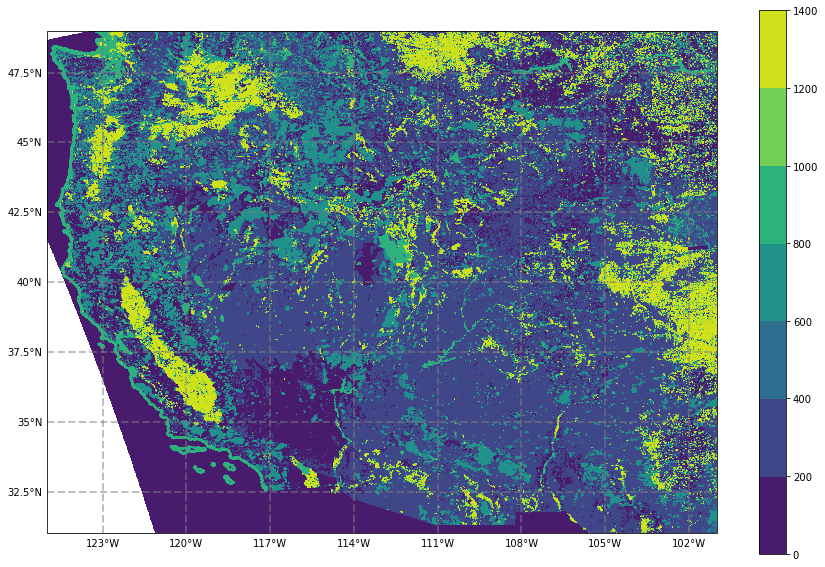

In [11]:
#make a map of the FCCS data
fig = plt.figure(figsize=(15,10))
ax= fig.add_subplot(111,projection=ccrs.PlateCarree())
#ax.set_extent([-126, -101, 32,49])
plt.contourf(LON, LAT, fccs)
#ax.coastlines()
#ax.add_feature(ccfeature.STATES, linestyle='-', color ='white')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,\
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
plt.colorbar()
plt.show()

In [10]:
loadings = np.nan*np.zeros(fccs.shape)
# loop over the map and fill it in with the fuel loads from the map
for ii in range(fccs.shape[0]): #loop over the rows
    for jj in range(fccs.shape[1]): #columns
        if not np.isnan(fccs[ii,jj]):
            try:
                loadings[ii,jj] = load_grouped_final[fccs[ii,jj]]*247.105 #to convert tons/acre into tons, 1km grid
            except:
                print('fuel type '+str(fccs[ii,jj]) + ' missing')
                loadings[ii,jj]=np.nan
        

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 628.0 missing
fuel type 630.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 

fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 614.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 620.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 616.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 618.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 

fuel type 601.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 614.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 614.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 620.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 623.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 623.0 missing
fuel type 628.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 611.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 620.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 630.0 

fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 620.0 missing
fuel type 611.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 630.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 628.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 614.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 628.0 

fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 634.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 629.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 614.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 

fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 620.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 624.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 

fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 629.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 623.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 634.0 missing
fuel type 634.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 638.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 614.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 636.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 636.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 636.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 623.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 629.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 630.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 629.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 636.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 610.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 

fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 631.0 missing
fuel type 631.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 631.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 631.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 631.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 631.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 631.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 631.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 634.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 636.0 missing
fuel type 636.0 missing
fuel type 636.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 620.0 missing
fuel type 602.0 

fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 634.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 634.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 634.0 missing
fuel type 634.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 632.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 631.0 

fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 620.0 missing
fuel type 636.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 631.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 615.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 634.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 634.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 633.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 630.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 620.0 missing
fuel type 611.0 

fuel type 630.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 631.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 633.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 601.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 616.0 missing
fuel type 616.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 629.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 

fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 620.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 636.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 615.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 

fuel type 635.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 602.0 

fuel type 615.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 633.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 633.0 missing
fuel type 632.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 630.0 

fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 636.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 615.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 632.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 616.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 610.0 missing
fuel type 616.0 missing
fuel type 635.0 missing
fuel type 620.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 601.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 633.0 

fuel type 602.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 632.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 

fuel type 629.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 603.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 

fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 615.0 missing
fuel type 632.0 missing
fuel type 633.0 missing
fuel type 610.0 

fuel type 611.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 623.0 missing
fuel type 632.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 620.0 

fuel type 611.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 616.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 629.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 631.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 629.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 636.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 633.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 636.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 636.0 missing
fuel type 636.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 619.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 623.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 629.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 

fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 

fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 616.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 

fuel type 615.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 623.0 

fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 636.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 611.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 631.0 missing
fuel type 631.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 601.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 

fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 624.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 634.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 611.0 missing
fuel type 611.0 

fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 620.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 629.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 615.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 620.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 620.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 620.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 620.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 624.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 614.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 615.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 619.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 629.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 610.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 635.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 

fuel type 614.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 623.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 614.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 629.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 611.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 623.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 631.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 630.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 627.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 614.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 

fuel type 616.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 632.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 

fuel type 611.0 missing
fuel type 602.0 missing
fuel type 631.0 missing
fuel type 631.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 633.0 missing
fuel type 615.0 

fuel type 602.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 627.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 628.0 missing
fuel type 632.0 missing
fuel type 615.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 604.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 623.0 missing
fuel type 624.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 624.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 632.0 missing
fuel type 627.0 

fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 628.0 missing
fuel type 627.0 missing
fuel type 616.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 614.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 632.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 635.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 629.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 601.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 616.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 624.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 616.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 623.0 missing
fuel type 616.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 637.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 637.0 missing
fuel type 637.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 

fuel type 610.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 637.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 610.0 

fuel type 627.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 900.0 

fuel type 615.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 632.0 missing
fuel type 630.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 631.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 623.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 616.0 

fuel type 630.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 

fuel type 630.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 614.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 618.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 

fuel type 900.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 623.0 

fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 624.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 610.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 631.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 

fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 633.0 missing
fuel type 611.0 

fuel type 627.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 634.0 missing
fuel type 634.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 637.0 missing
fuel type 602.0 missing
fuel type 636.0 missing
fuel type 615.0 missing
fuel type 637.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 611.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 

fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 614.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 

fuel type 601.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 632.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 614.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 628.0 

fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 633.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 618.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 

fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 614.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 630.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 618.0 missing
fuel type 618.0 missing
fuel type 900.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 627.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 620.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 

fuel type 630.0 missing
fuel type 624.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 611.0 

fuel type 627.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 630.0 

fuel type 601.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 614.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 611.0 missing
fuel type 611.0 

fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 618.0 missing
fuel type 618.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 624.0 

fuel type 623.0 missing
fuel type 624.0 missing
fuel type 631.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 624.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 620.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 627.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 

fuel type 627.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 

fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 627.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 

fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 618.0 missing
fuel type 618.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 610.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 

fuel type 610.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 624.0 

fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 628.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 624.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 624.0 missing
fuel type 633.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 616.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 615.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 632.0 missing
fuel type 631.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 616.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 603.0 missing
fuel type 603.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 627.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 614.0 missing
fuel type 614.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 629.0 missing
fuel type 629.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 900.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 638.0 missing
fuel type 612.0 missing
fuel type 628.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 624.0 missing
fuel type 632.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 616.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 638.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 635.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 612.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 631.0 missing
fuel type 631.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 629.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 625.0 missing
fuel type 612.0 missing
fuel type 612.0 missing
fuel type 630.0 missing
fuel type 612.0 missing
fuel type 612.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 631.0 missing
fuel type 631.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 630.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 612.0 missing
fuel type 612.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 638.0 missing
fuel type 635.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 611.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 616.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 611.0 

fuel type 602.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 635.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 632.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 631.0 missing
fuel type 631.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 632.0 missing
fuel type 602.0 

fuel type 624.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 633.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 601.0 missing
fuel type 624.0 missing
fuel type 624.0 

fuel type 632.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 632.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 624.0 

fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 627.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 618.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 628.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 615.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 604.0 missing
fuel type 604.0 missing
fuel type 604.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 631.0 missing
fuel type 631.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 623.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 624.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 628.0 missing
fuel type 624.0 

fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 602.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 630.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 611.0 missing
fuel type 602.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 616.0 missing
fuel type 633.0 missing
fuel type 624.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 632.0 missing
fuel type 632.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 900.0 

fuel type 623.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 611.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 601.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 

fuel type 610.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 633.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 610.0 missing
fuel type 630.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 628.0 missing
fuel type 603.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 635.0 missing
fuel type 602.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 611.0 missing
fuel type 624.0 missing
fuel type 624.0 missing
fuel type 611.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 610.0 missing
fuel type 610.0 missing
fuel type 635.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 623.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 635.0 missing
fuel type 627.0 missing
fuel type 633.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 627.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 624.0 missing
fuel type 630.0 missing
fuel type 610.0 

fuel type 627.0 missing
fuel type 627.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 630.0 missing
fuel type 630.0 missing
fuel type 635.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 601.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 623.0 missing
fuel type 627.0 missing
fuel type 630.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 631.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 

fuel type 624.0 missing
fuel type 630.0 missing
fuel type 628.0 missing
fuel type 633.0 missing
fuel type 633.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 624.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 633.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 623.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 611.0 missing
fuel type 635.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 633.0 missing
fuel type 611.0 missing
fuel type 610.0 

fuel type 611.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 602.0 missing
fuel type 603.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 603.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 

fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 628.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 632.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 615.0 missing
fuel type 615.0 missing
fuel type 611.0 missing
fuel type 611.0 

fuel type 611.0 missing
fuel type 602.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 624.0 missing
fuel type 611.0 missing
fuel type 611.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 623.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 610.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

fuel type 900.0 missing
fuel type 602.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 missing
fuel type 900.0 

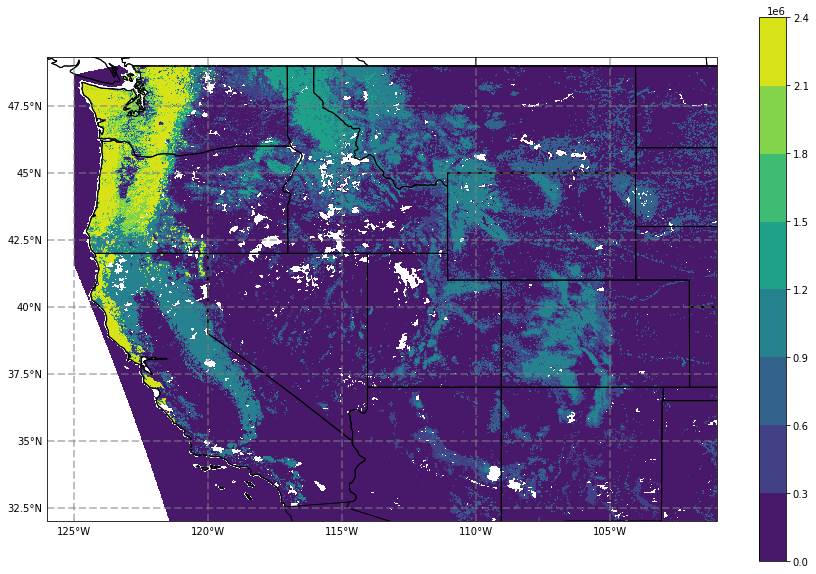

In [9]:
#make a map of the Fuel loadings data
fig = plt.figure(figsize=(15,10))
ax= fig.add_subplot(111,projection=ccrs.PlateCarree())
ax.set_extent([-126, -101, 32,49])
plt.contourf(LON, LAT, loadings)
ax.coastlines()
ax.add_feature(cfeature.STATES, linestyle='-')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,\
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
plt.colorbar()
plt.show()